# Data preprocessing

## Описание данных

В таблице `Trading_session` есть:
- `id`;
- `date` – дата сессии;
- `trading_type` – месячная или суточная сессия;
- `platform_id` – принимает значения `1` (Локосово) или `2` (Надым).

Вторая таблица – `Chart_data`, в ней хранятся данные о сделках. 

- Столбец `session_id` – это `foreign key`, чтобы связать две таблицы. 

- Столбец `lot_size` – объем сделки. 

- Столбец `deal_id` – может быть несколько сделок с одним и тем же значением `deal_id`, нас интересует та, которая произошла раньше всех.

In [1]:
from data_utils import *

%config InlineBackend.figure_format = 'retina'

Загрузим данные и посмотрим на датафреймы.

In [2]:
trading_session_df, chart_data_df = load_data("data/trade_info.sqlite3")

In [3]:
trading_session_df.head(3)

,session_id,date,trading_type,platform_id
0,11,2019-10-04,daily,1
1,12,2019-10-03,daily,2
2,13,2019-10-01,daily,2


In [4]:
chart_data_df.head(3)

,chart_id,time,lot_size,session_id,deal_id,price
0,0,11:34:47,2,12,0,-0.235500
1,1,11:32:37,2,13,1,-0.235500
2,2,11:52:45,13,13,2,-0.303677


In [5]:
print_data_info(trading_session_df, chart_data_df)

Размер датафрейма trading_session_df:              (265, 4)
Размер датафрейма chart_data_df:                   (5508, 6)

Число уникальных session_id в trading_session_df:  265
Число уникальных session_id в chart_data_df:       261

Число уникальных chart_id в chart_data_df:         5508
Число уникальных deal_id в chart_data_df:          4616


Так как нам нужны только самые первые сделки для каждого `deal_id`, то уберем все ненужное.

In [6]:
chart_data_df = chart_data_df.sort_values(['deal_id', 'time']).groupby('deal_id').first().reset_index()
print(f"Размер chart_data_df: {chart_data_df.shape}")
chart_data_df.head()

Размер chart_data_df: (4616, 6)


,deal_id,chart_id,time,lot_size,session_id,price
0,0,0,11:34:47,2,12,-0.235500
1,1,1,11:32:37,2,13,-0.235500
2,2,2,11:52:45,13,13,-0.303677
3,3,3,11:53:07,25,13,-0.303677
4,4,4,12:00:43,124,13,-0.364279


In [7]:
compare_session_id(trading_session_df, chart_data_df)

Число уникальных session_id в trading_session_df: 265
Число уникальных session_id в chart_data_df: 255
Число общих сессий: 254


Соединим две таблицы.

In [8]:
result = pd.merge(trading_session_df, chart_data_df, how="inner", on=['session_id'])
print(f"Размер общей таблицы result: {result.shape}")
result.head()

Размер общей таблицы result: (4609, 9)


,session_id,date,trading_type,platform_id,deal_id,chart_id,time,lot_size,price
0,12,2019-10-03,daily,2,0,0,11:34:47,2,-0.235500
1,13,2019-10-01,daily,2,1,1,11:32:37,2,-0.235500
2,13,2019-10-01,daily,2,2,2,11:52:45,13,-0.303677
3,13,2019-10-01,daily,2,3,3,11:53:07,25,-0.303677
4,13,2019-10-01,daily,2,4,4,12:00:43,124,-0.364279


Разобьем сессии на дневные и месячные. Работать будем с месячными. Кроме того разобьем все сессии согласно платформе.

In [9]:
daily_df, monthly_df = get_dataframes(result)
daily_df, monthly_df = delete_small_sessions(daily_df), delete_small_sessions(monthly_df)
daily_df, monthly_df = add_columns(daily_df), add_columns(monthly_df)

In [10]:
print(daily_df.shape, monthly_df.shape)

(453, 15) (2971, 15)


In [11]:
monthly_df.head(3)

,session_id,date,trading_type,platform_id,deal_id,chart_id,time,lot_size,price,global_date,hour,minute,second,norm_price,norm_lot_size
53,27,2019-10-24,monthly,1,53,53,11:04:47,21,0.143263,2019-10-24 11:04:47,11,4,47,0.081766,-0.134290
54,27,2019-10-24,monthly,1,54,54,11:07:08,5,0.067510,2019-10-24 11:07:08,11,7,8,0.008126,-0.270339
55,27,2019-10-24,monthly,1,55,55,11:07:08,3,0.067510,2019-10-24 11:07:08,11,7,8,0.008126,-0.287345


In [12]:
daily_df_1 = daily_df[daily_df.platform_id == 1]
daily_df_2 = daily_df[daily_df.platform_id == 2]

monthly_df_1 = monthly_df[monthly_df.platform_id == 1]
monthly_df_2 = monthly_df[monthly_df.platform_id == 2]

# Clustering

Для кластеризации временных рядов использовал $\href{https://tslearn.readthedocs.io/en/stable/index.html}{tslearn}$.

In [13]:
from clustering_utils import *

# Кластеризация месячных торгов

Посмотрим на среднюю цену внутри одной сессии относительно месяца, в который шла эта сессия. Идея: может быть получится выделить тот факт, что цена меняется в зависимости от сезона.

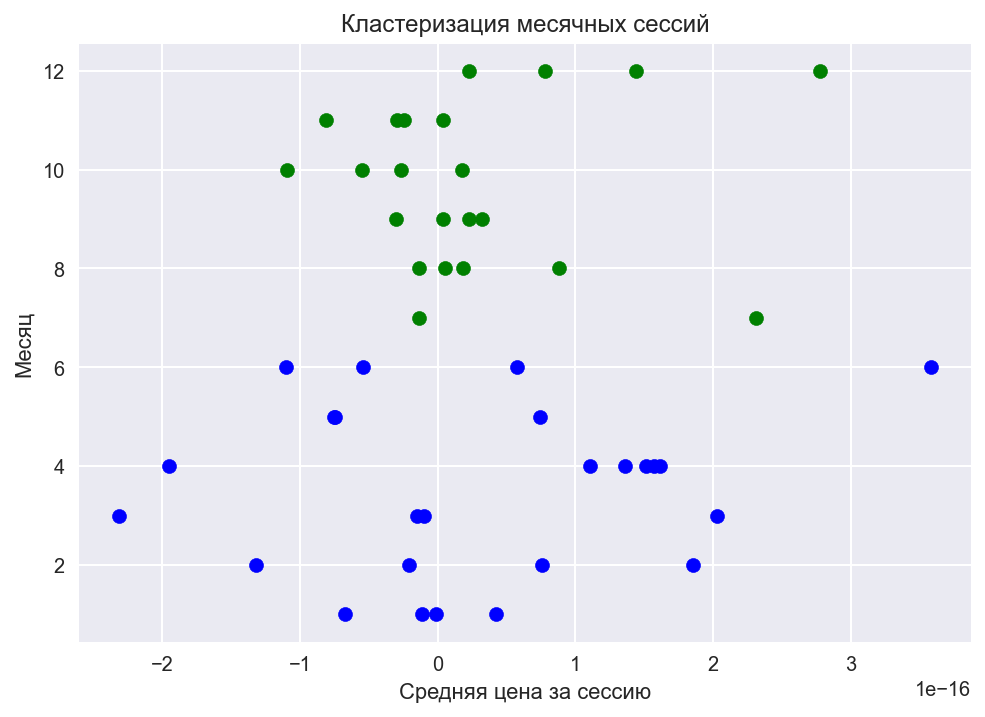

In [14]:
use_general_kmeans(monthly_df, 2)

Никакой зависимости не наблюдается.

# Time series clustering

Рассмотрим сессии сразу по двум платформам.

In [15]:
seed = 0
np.random.seed(seed)

In [16]:
n_clusters = 8

In [17]:
train = prepare_data(monthly_df, 'norm_price')

## TimeSeriesKMeans

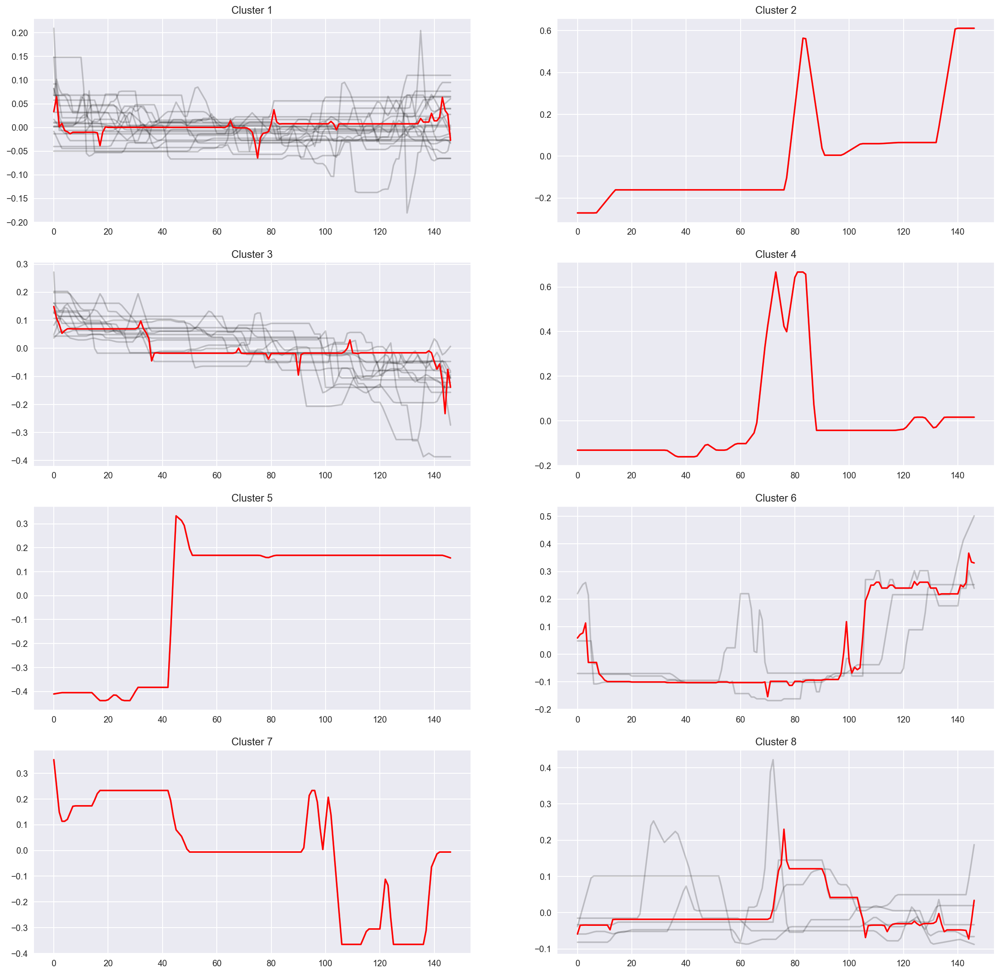

In [18]:
use_ts_kmeans(train, n_clusters, "dtw", seed)

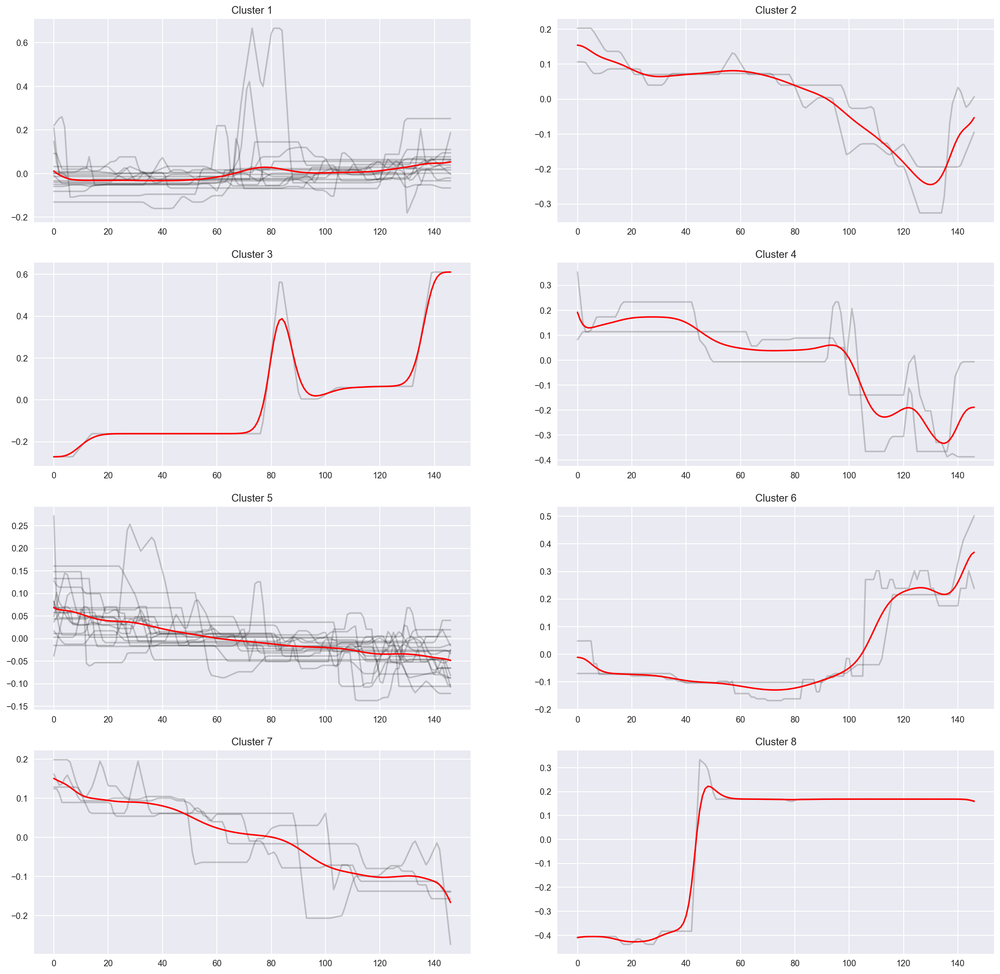

In [19]:
use_ts_kmeans(train, n_clusters, "softdtw", seed)

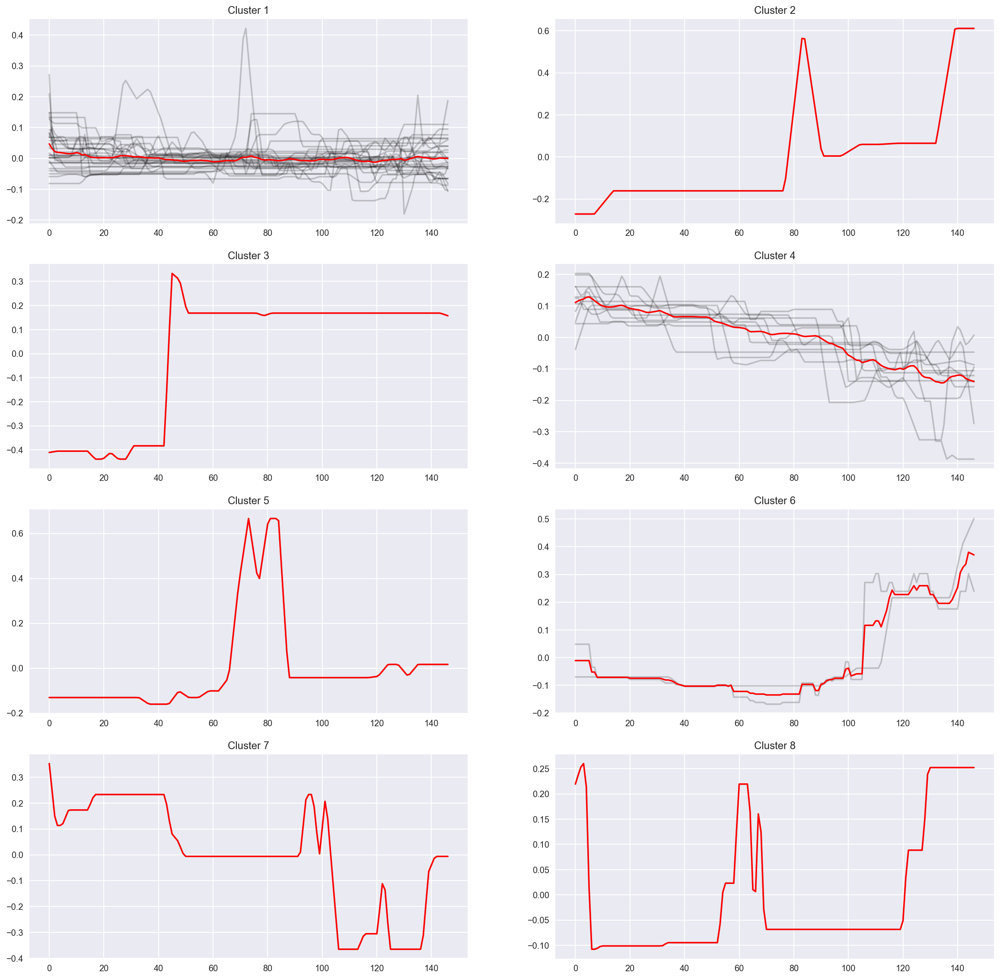

In [20]:
use_ts_kmeans(train, n_clusters, "euclidean", seed)

## KernelKMeans

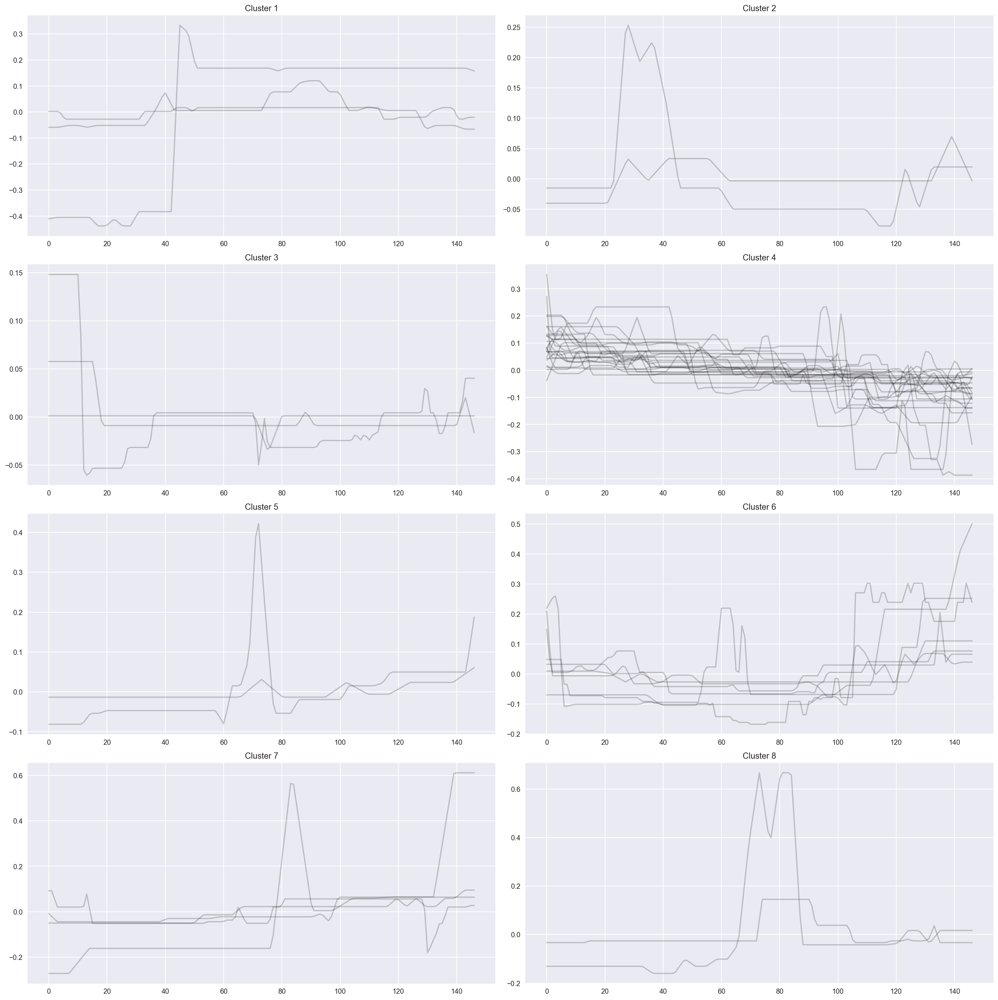

In [21]:
use_kernel_kmeans(train, n_clusters, seed)

## Выводы

Во всех методах кластеризации наблюдаются кластеры с похожими временными рядами. То есть среди примеров одного кластера можно наблюдать одинаковый тренд развития, одинаковые пики.

Возможно, что графики получились не очень хорошими, так как не так много данных. И в данных похоже есть ошибки. Например, есть время осуществления сделки в то время, когда платформа уже не работала.

## Time series clustering

Рассмотрим сессии отдельно по двум платформам. 

In [22]:
train_1 = prepare_data(monthly_df_1, 'norm_price')
train_2 = prepare_data(monthly_df_2, 'norm_price')

## TimeSeriesKMeans

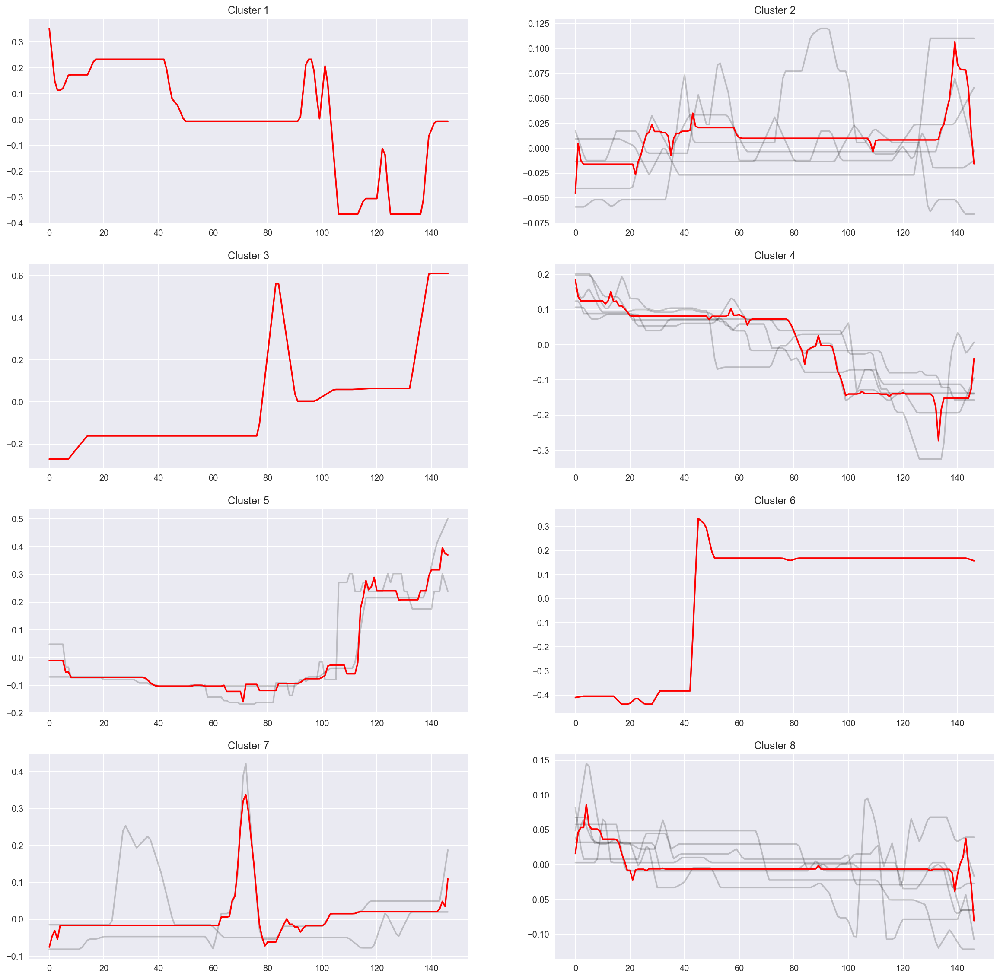

In [23]:
use_ts_kmeans(train_1, n_clusters, "dtw", seed)

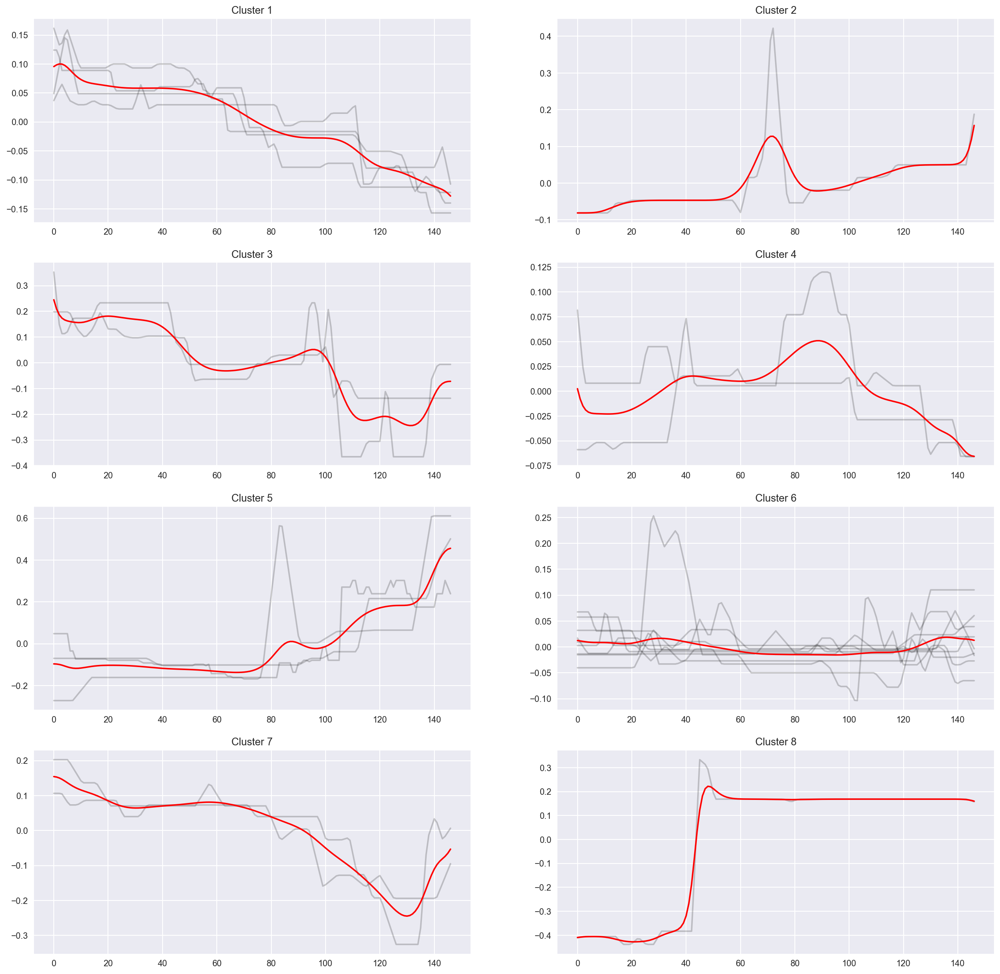

In [24]:
use_ts_kmeans(train_1, n_clusters, "softdtw", seed)

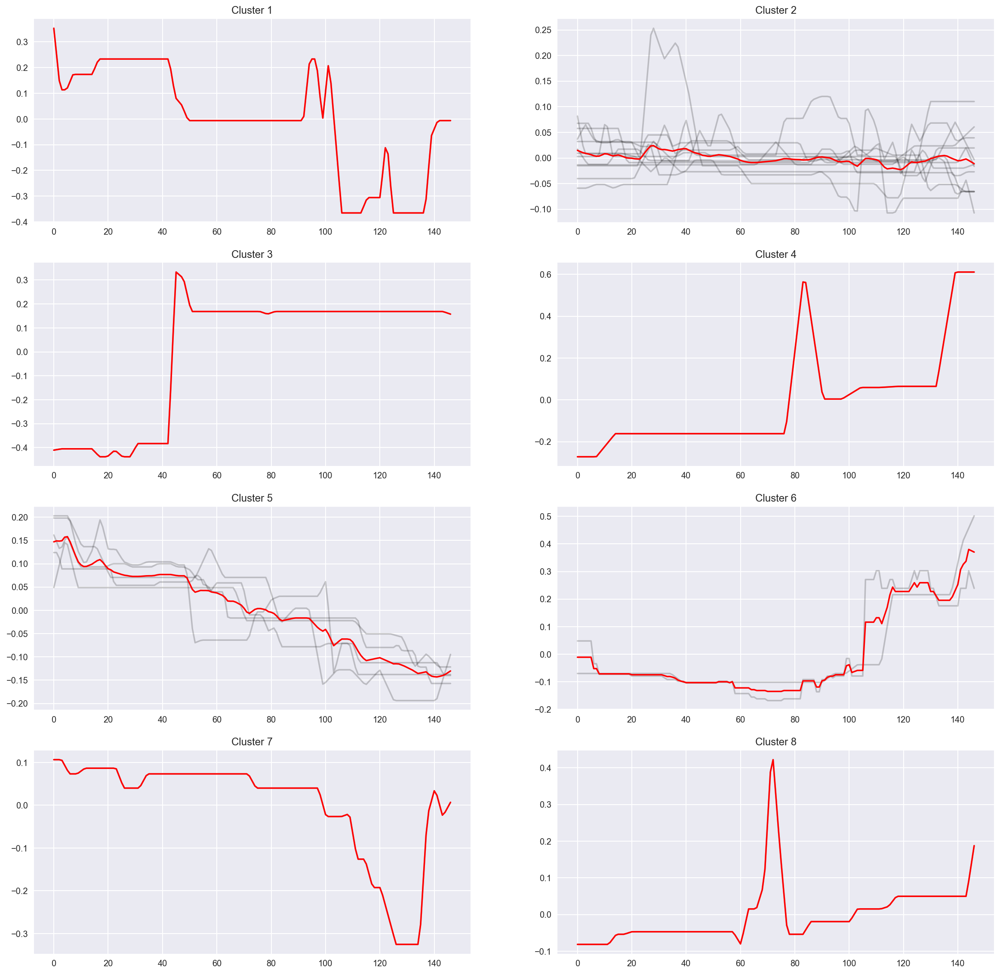

In [25]:
use_ts_kmeans(train_1, n_clusters, "euclidean", seed)

## KernelKMeans

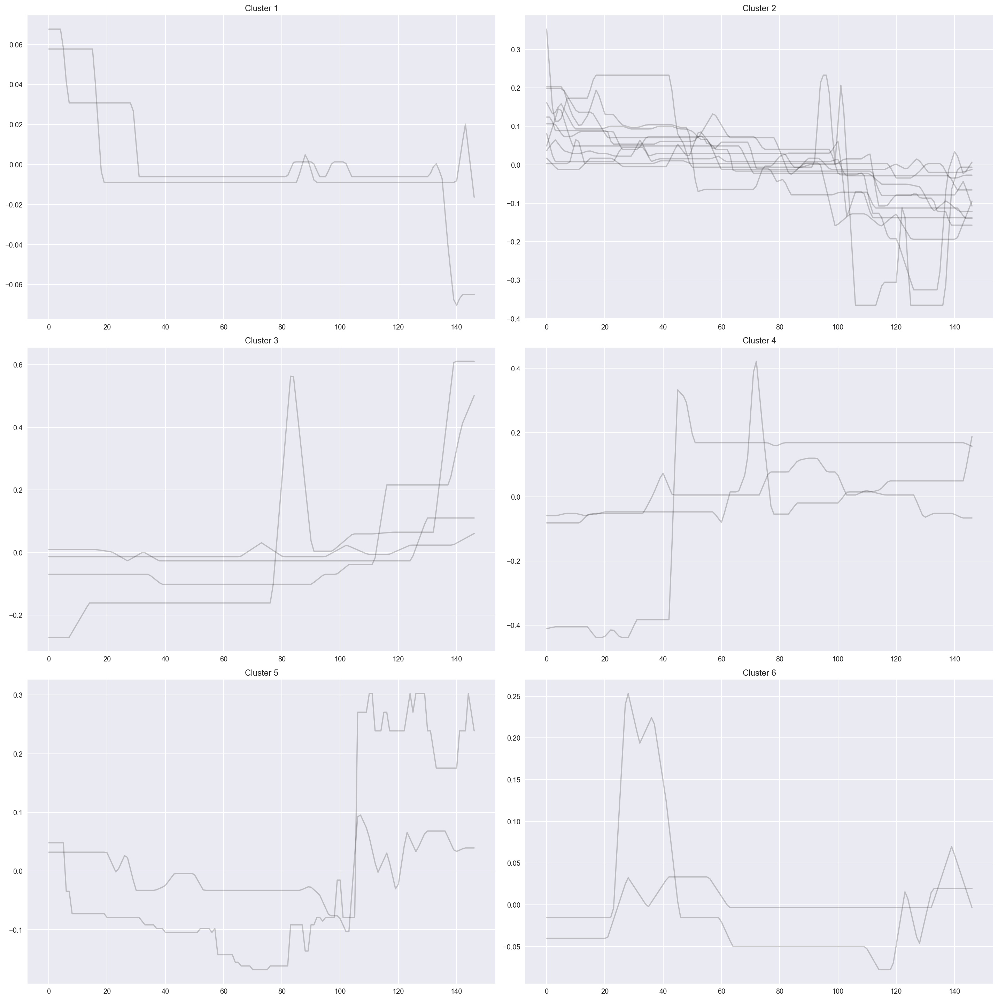

In [26]:
use_kernel_kmeans(train_1, 6, seed)

## TimeSeriesKMeans

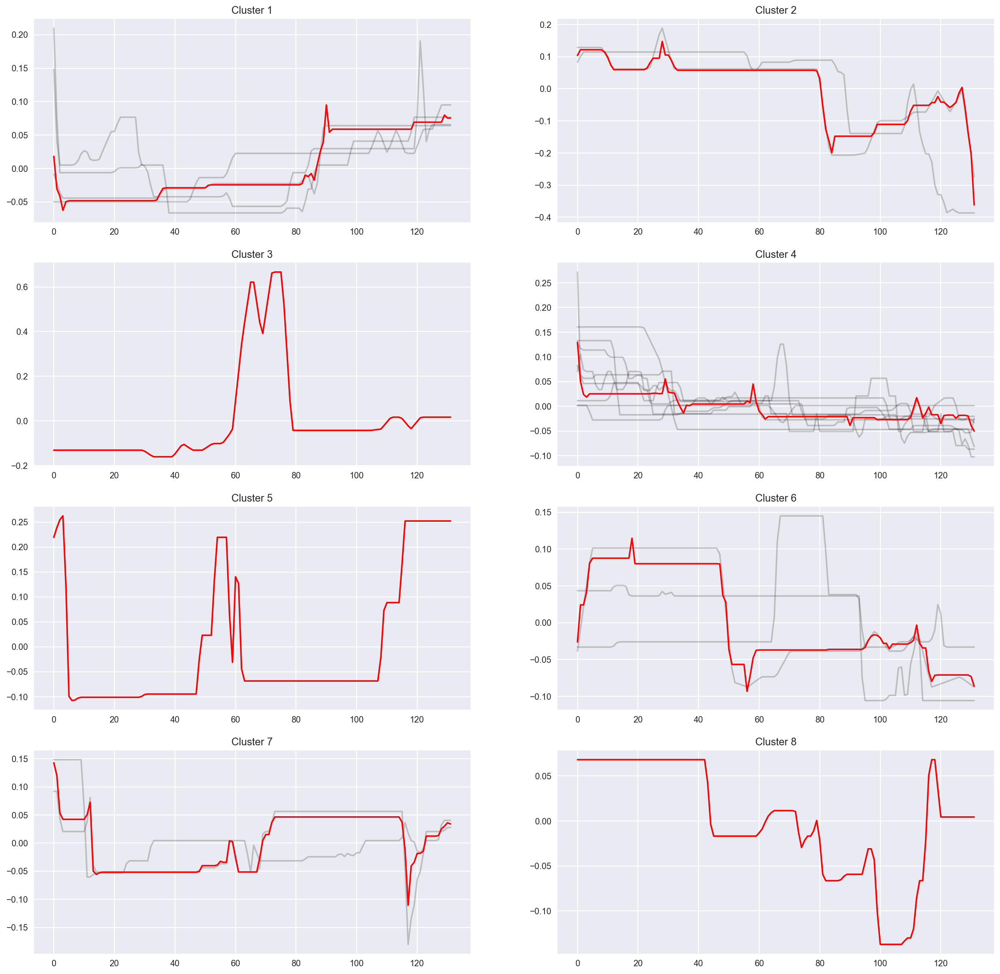

In [27]:
use_ts_kmeans(train_2, n_clusters, "dtw", seed)

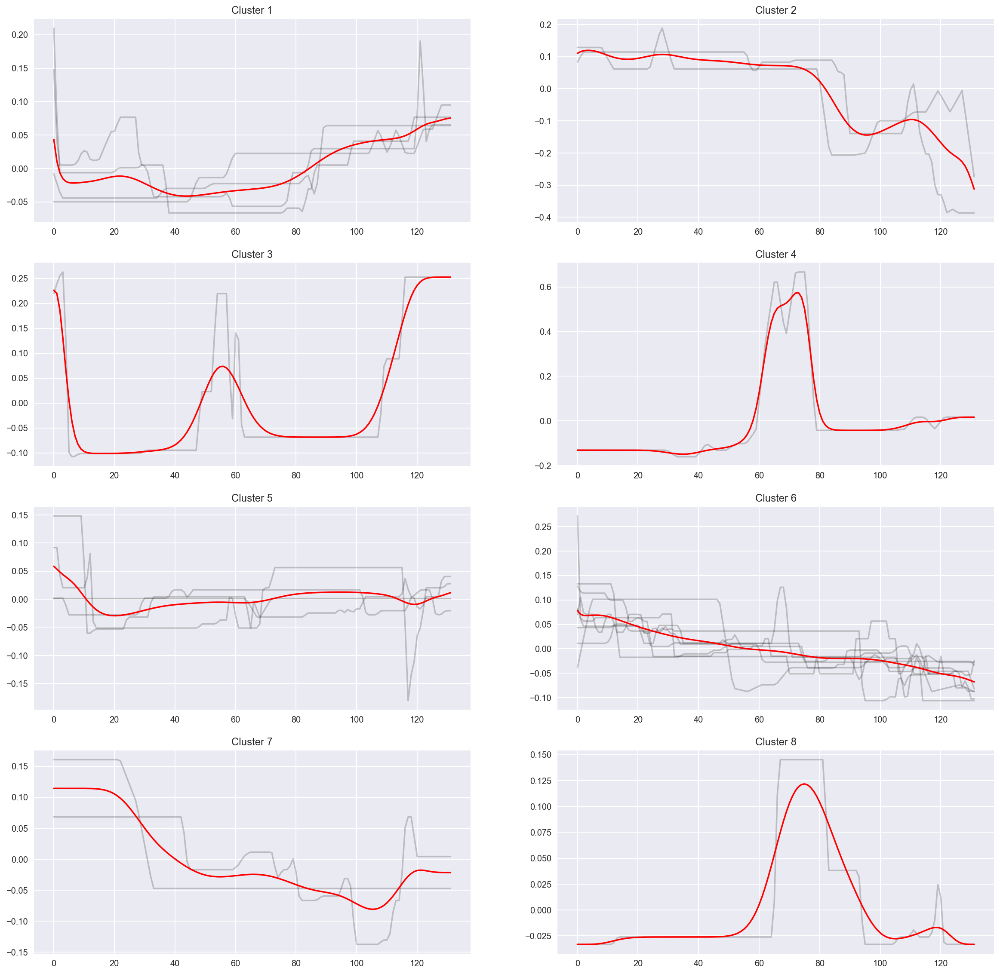

In [28]:
use_ts_kmeans(train_2, n_clusters, "softdtw", seed)

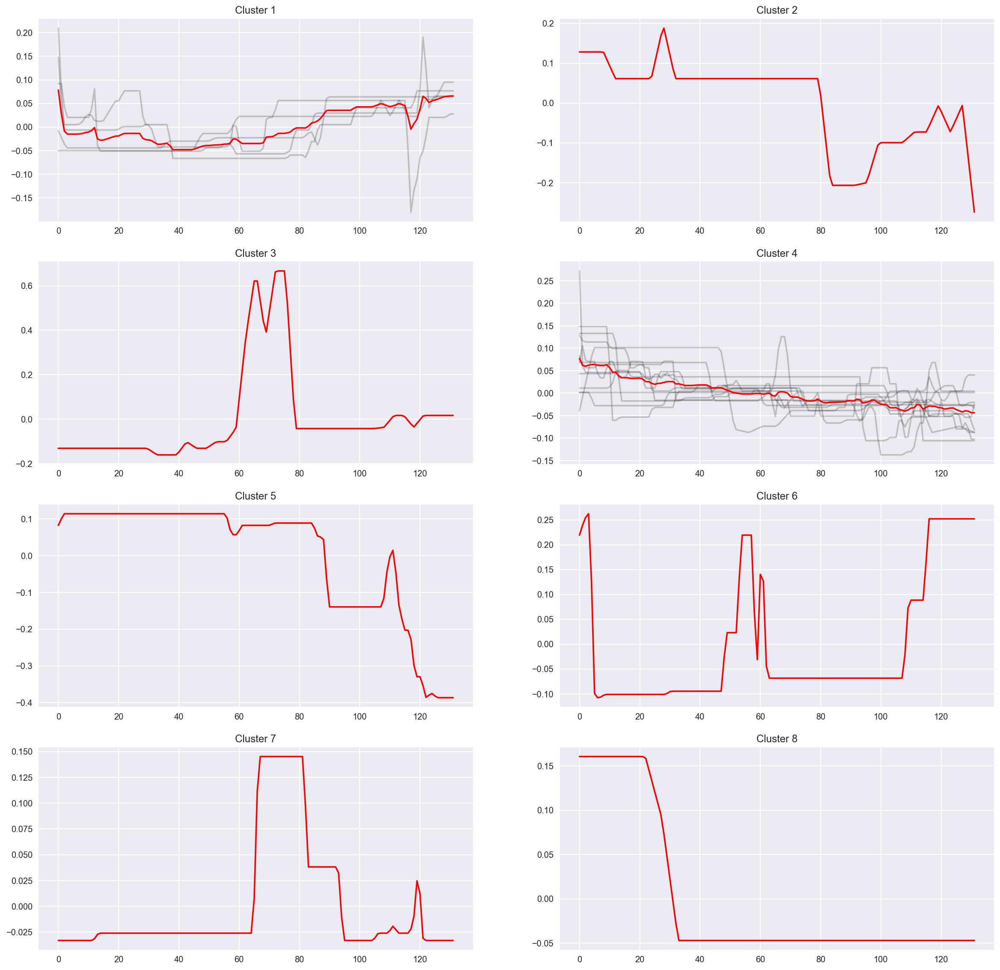

In [29]:
use_ts_kmeans(train_2, n_clusters, "euclidean", seed)

## KernelKMeans

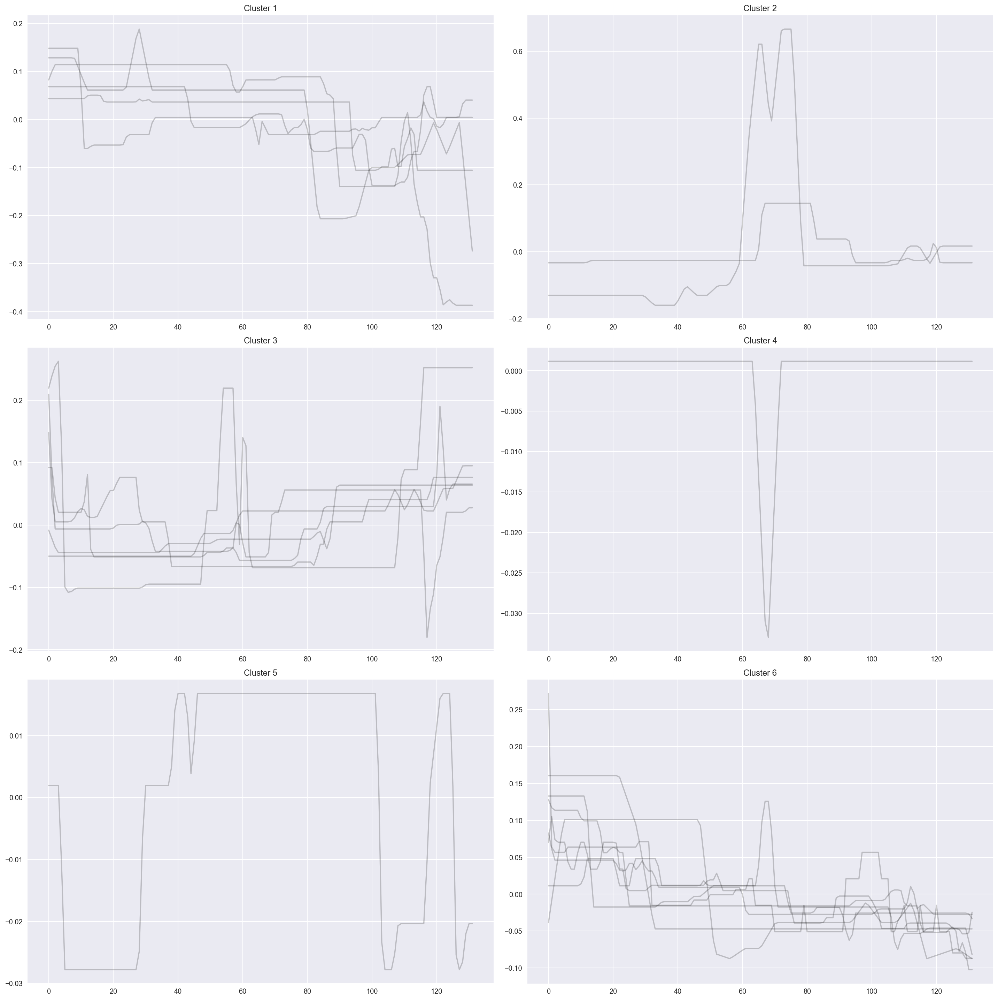

In [30]:
use_kernel_kmeans(train_2, 6, seed)

## Выводы

При разделении на платформы графики получились "чище". Для обеих площадок наблюдаются схожие тренды.

# Объем сделки

Посмотрим на объем сделки по двум площадкам.

In [31]:
train = prepare_data(monthly_df, 'norm_lot_size')

## TimeSeriesKMeans

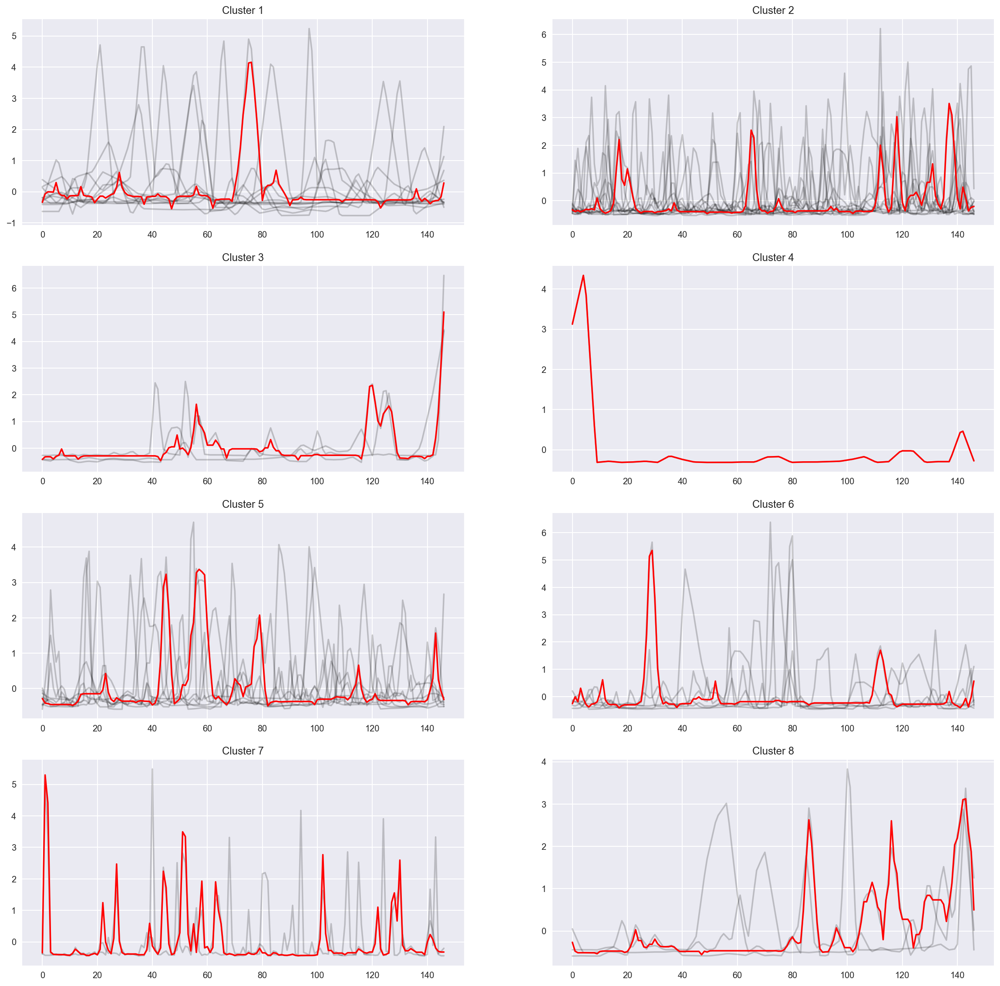

In [32]:
use_ts_kmeans(train, n_clusters, "dtw", seed)

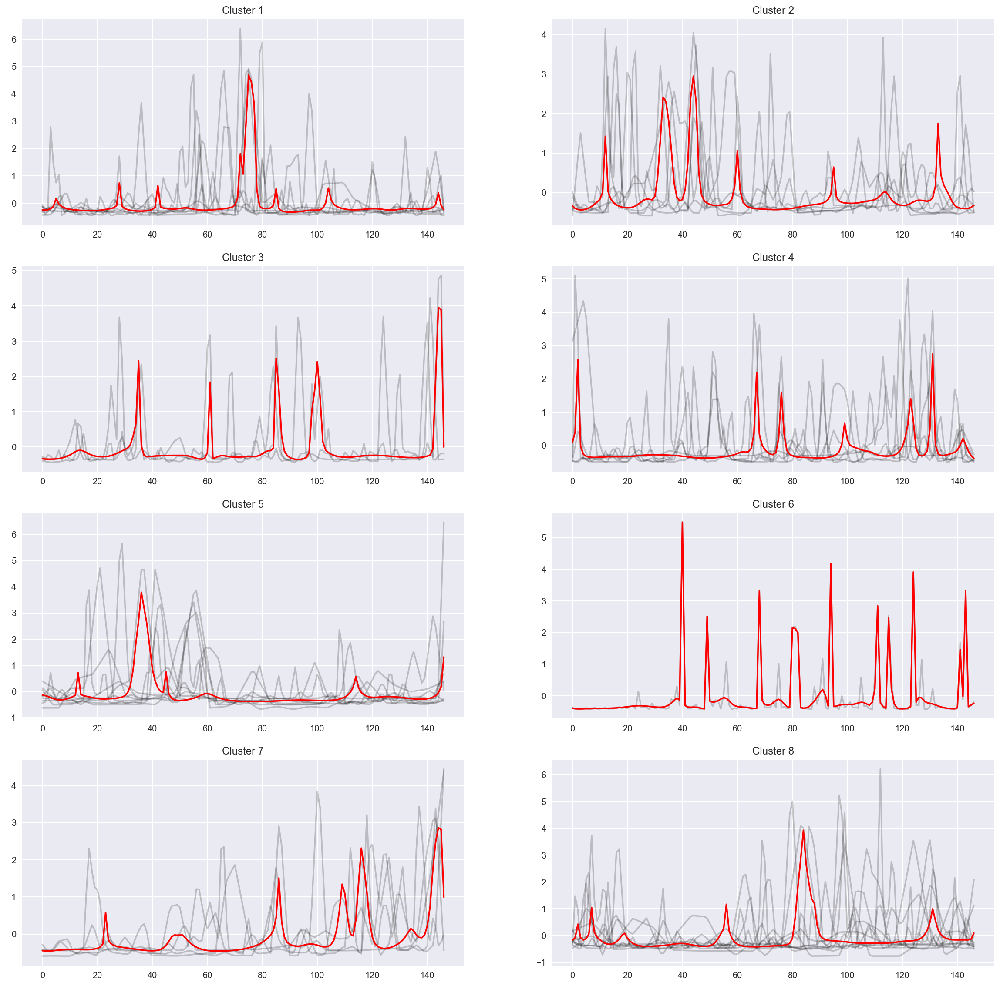

In [33]:
use_ts_kmeans(train, n_clusters, "softdtw", seed)

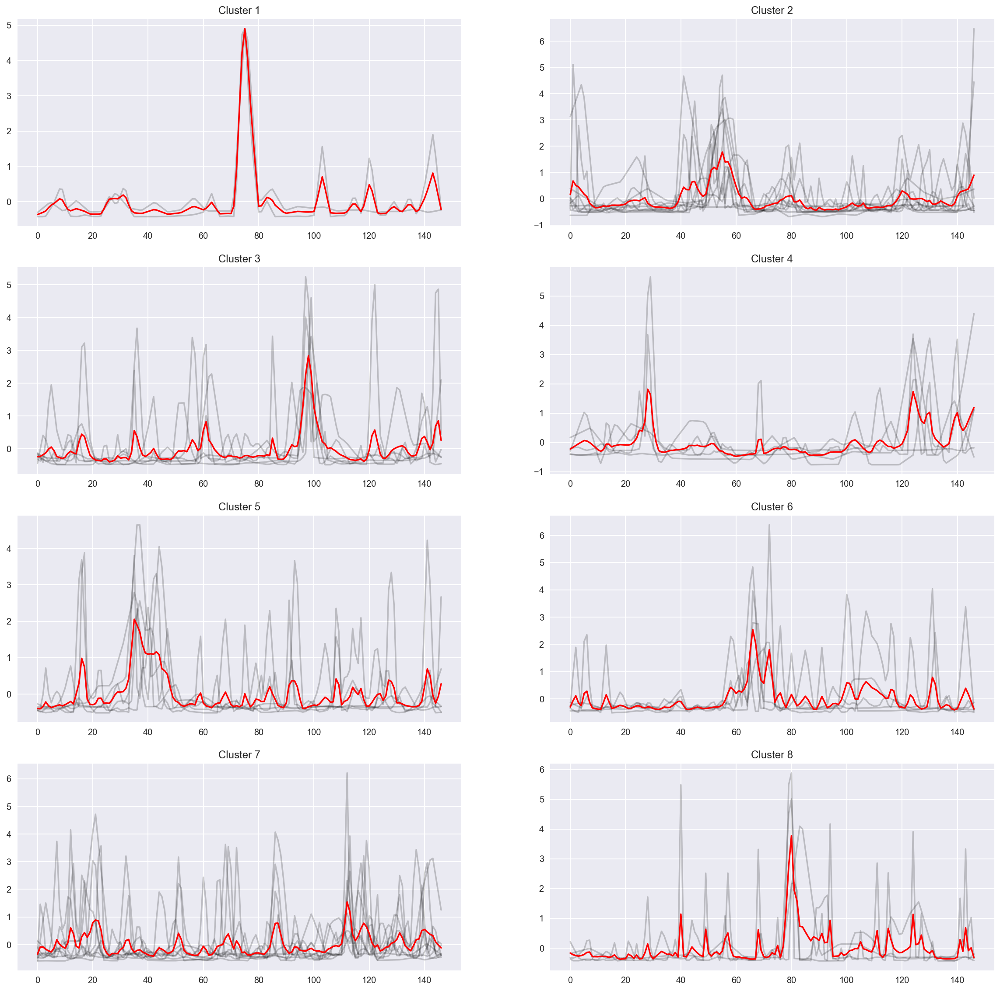

In [34]:
use_ts_kmeans(train, n_clusters, "euclidean", seed)

## KernelKMeans

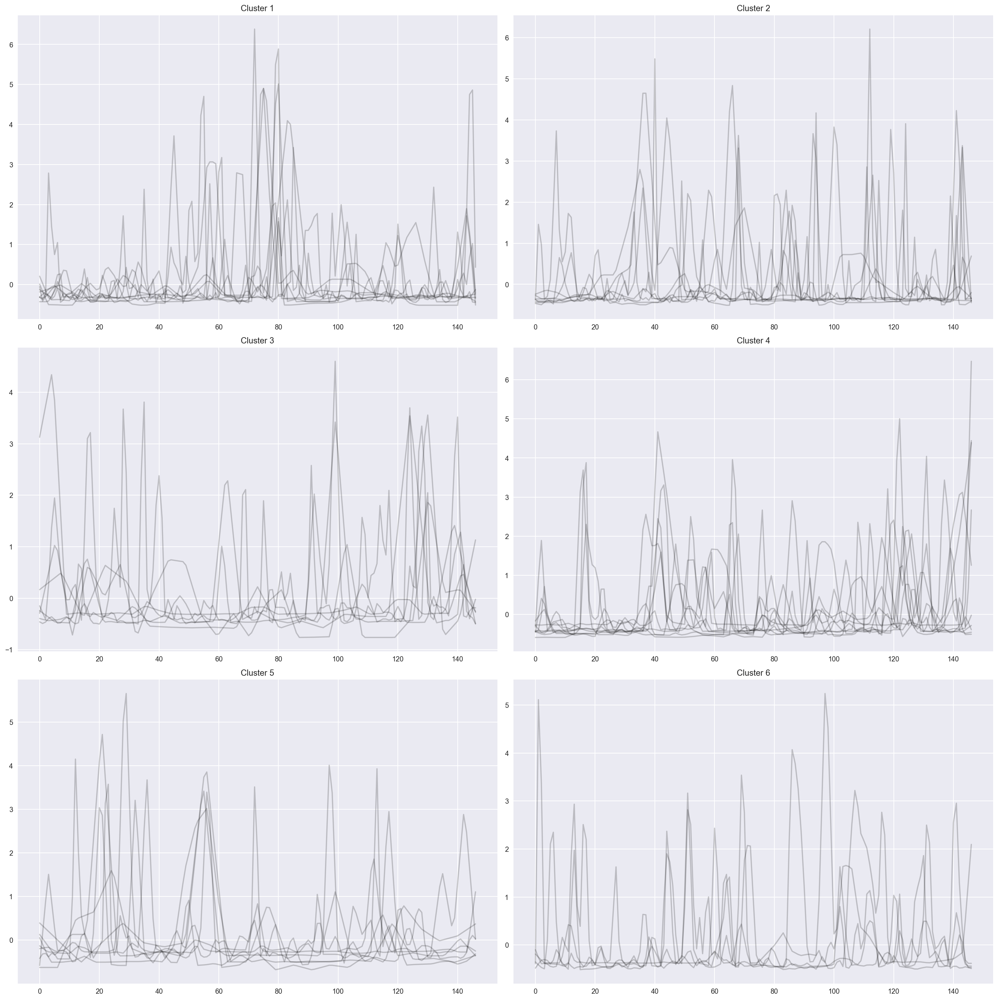

In [35]:
use_kernel_kmeans(train, 6, seed)

Есть несколько кластеров, в которых очень схожие сессии. Посмотрим отдельно по платформам.

In [36]:
train_1 = prepare_data(monthly_df_1, 'norm_lot_size')
train_2 = prepare_data(monthly_df_2, 'norm_lot_size')

## TimeSeriesKMeans

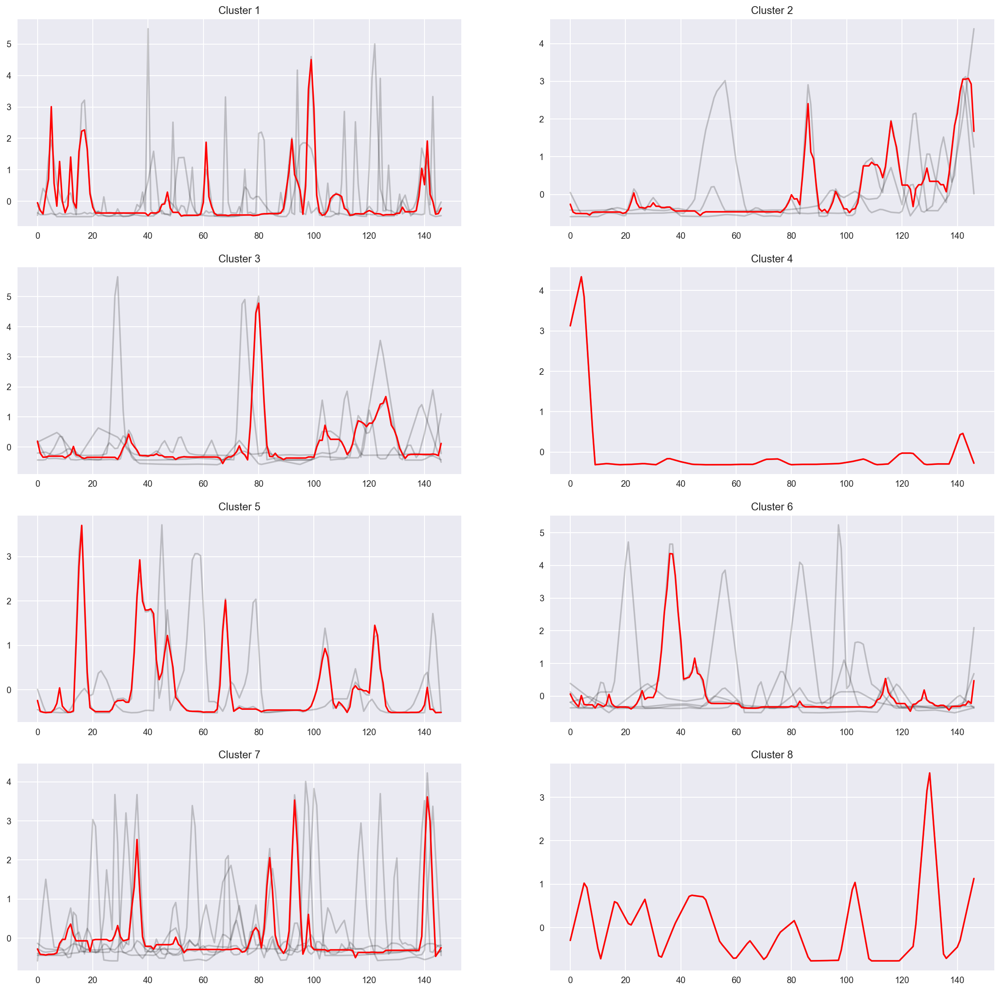

In [37]:
use_ts_kmeans(train_1, n_clusters, "dtw", seed)

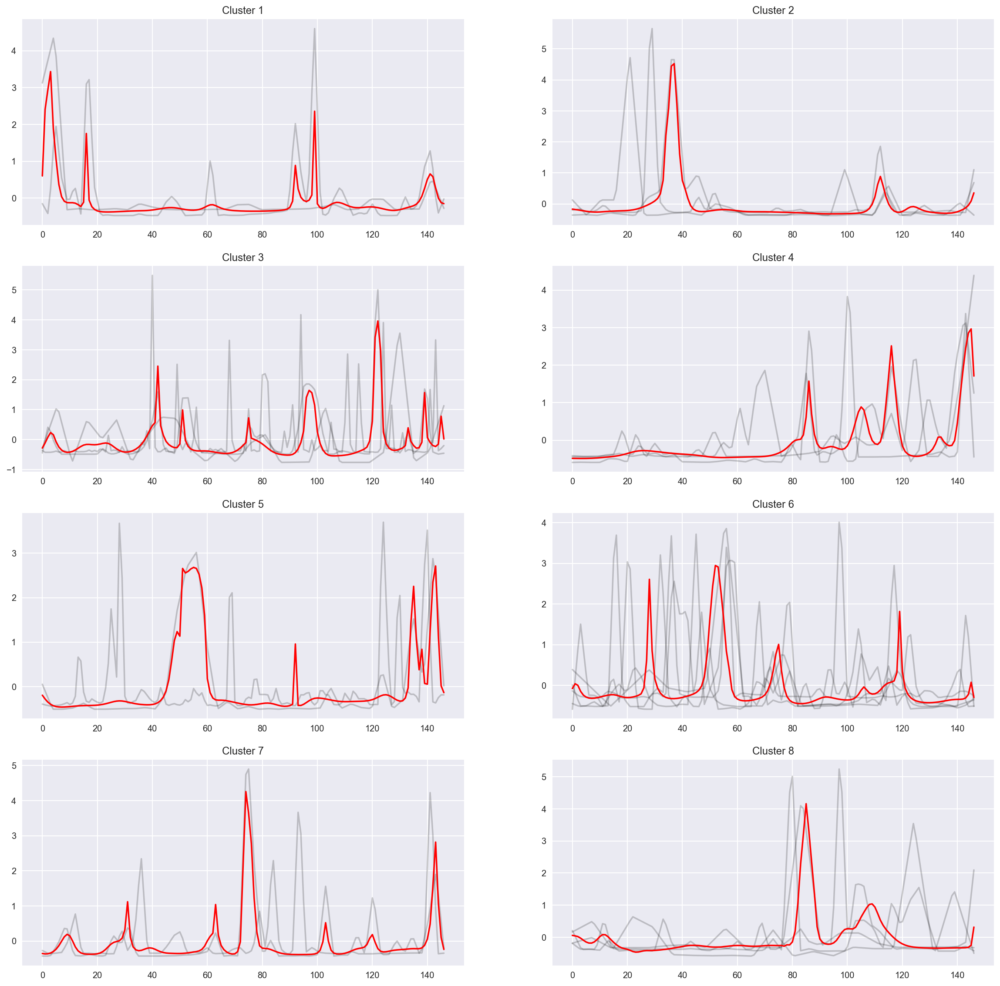

In [38]:
use_ts_kmeans(train_1, n_clusters, "softdtw", seed)

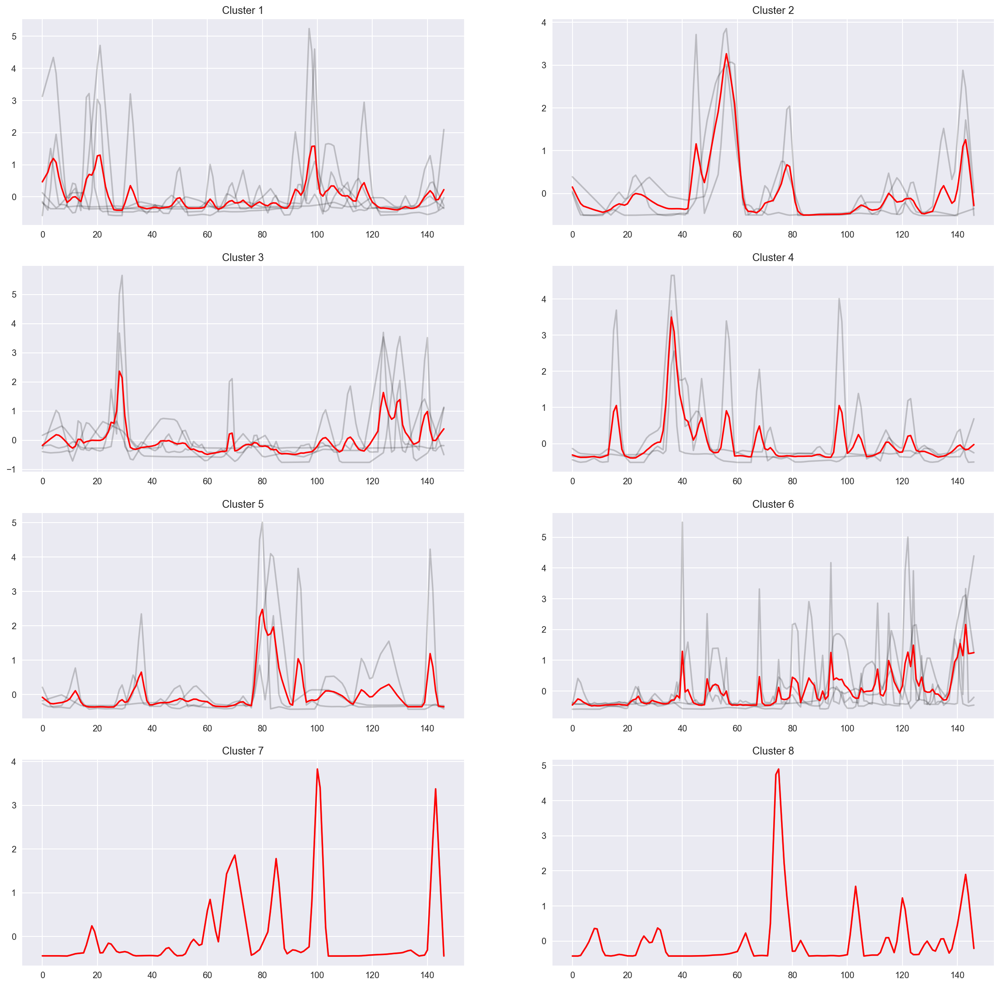

In [39]:
use_ts_kmeans(train_1, n_clusters, "euclidean", seed)

## KernelKMeans

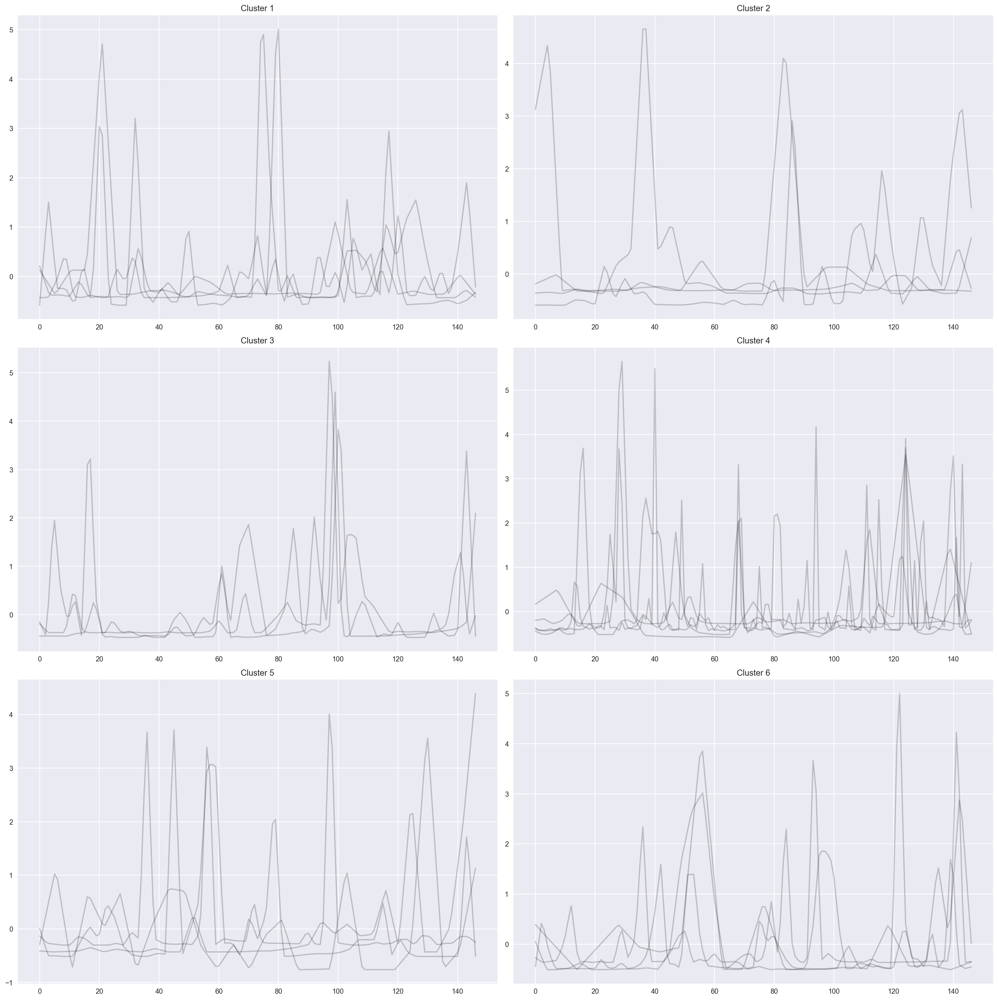

In [40]:
use_kernel_kmeans(train_1, 6, seed)

## TimeSeriesKMeans

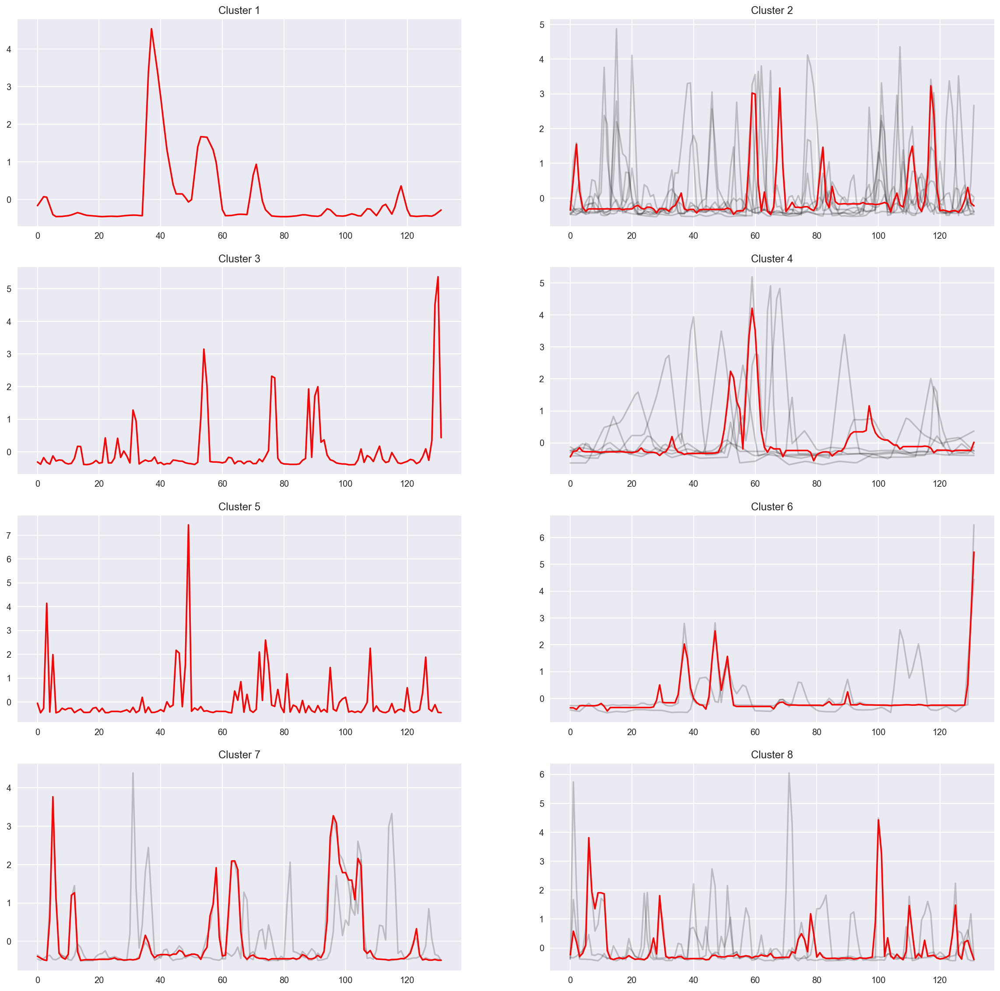

In [41]:
use_ts_kmeans(train_2, n_clusters, "dtw", seed)

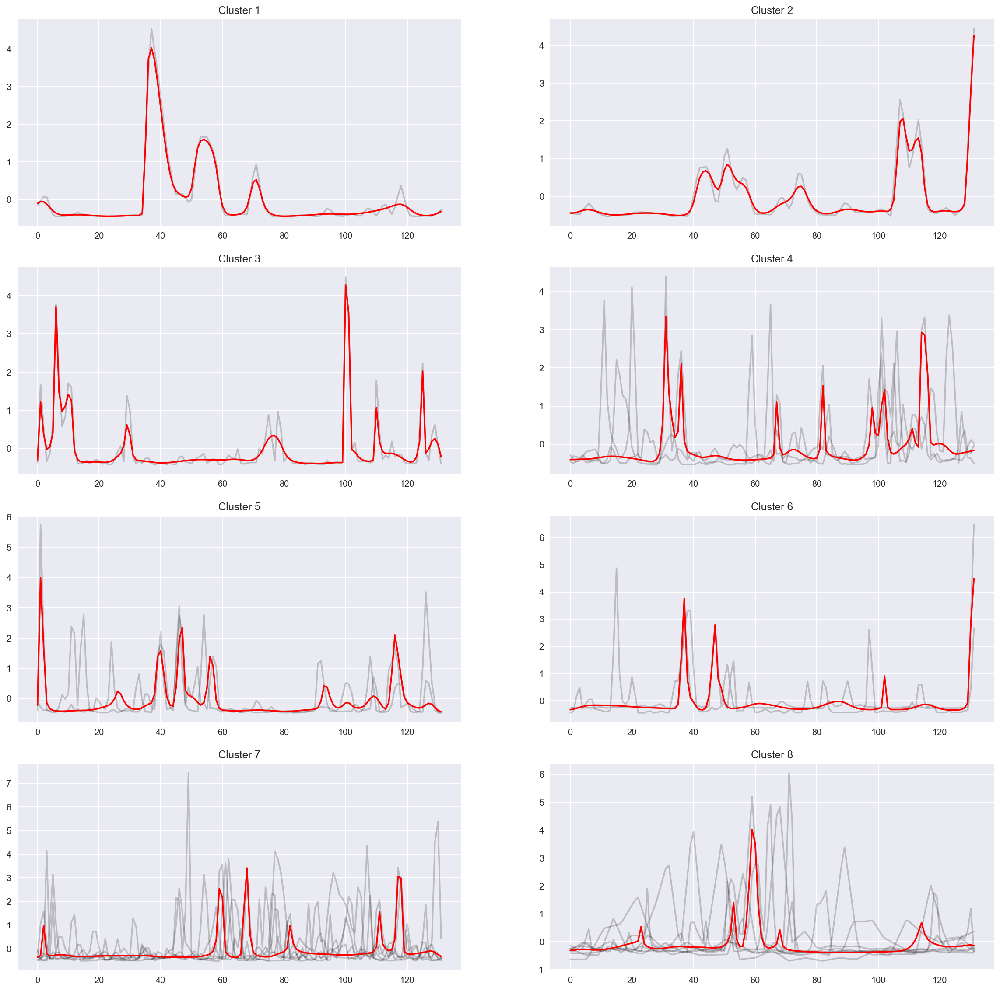

In [42]:
use_ts_kmeans(train_2, n_clusters, "softdtw", seed)

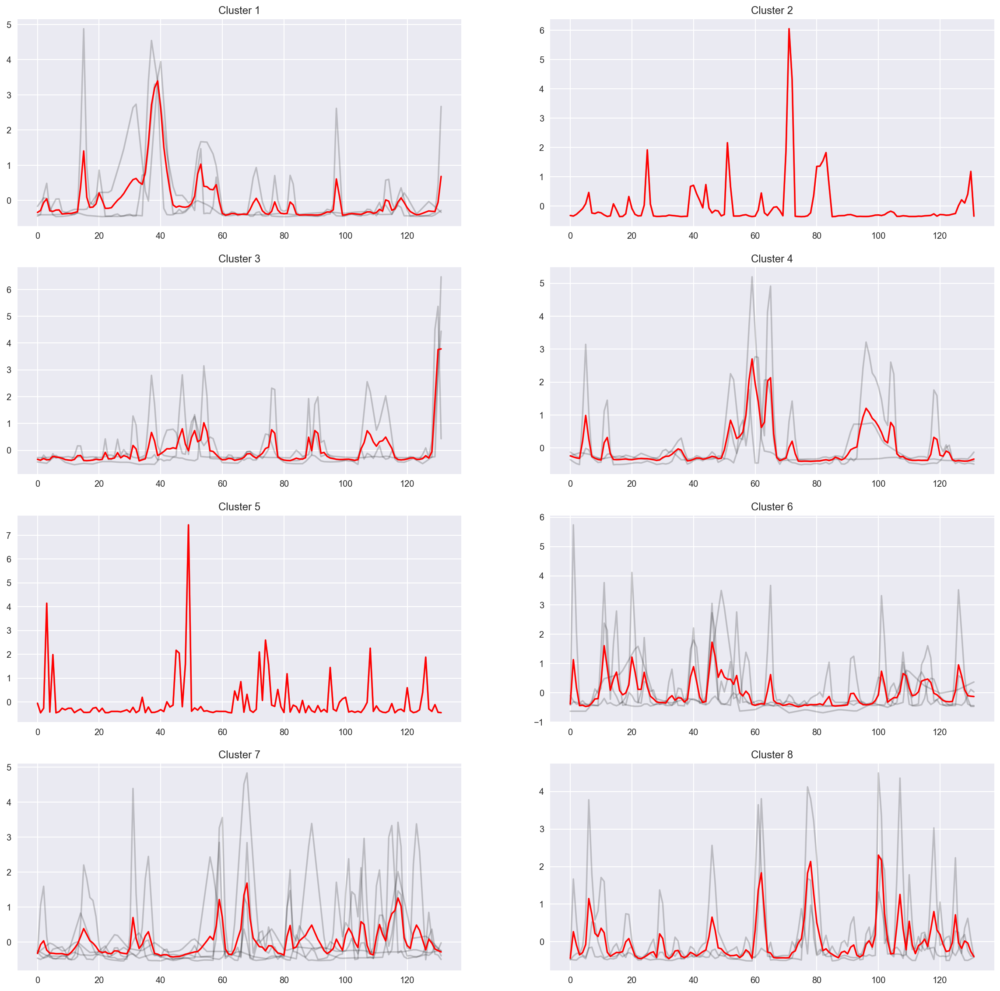

In [43]:
use_ts_kmeans(train_2, n_clusters, "euclidean", seed)

## KernelKMeans

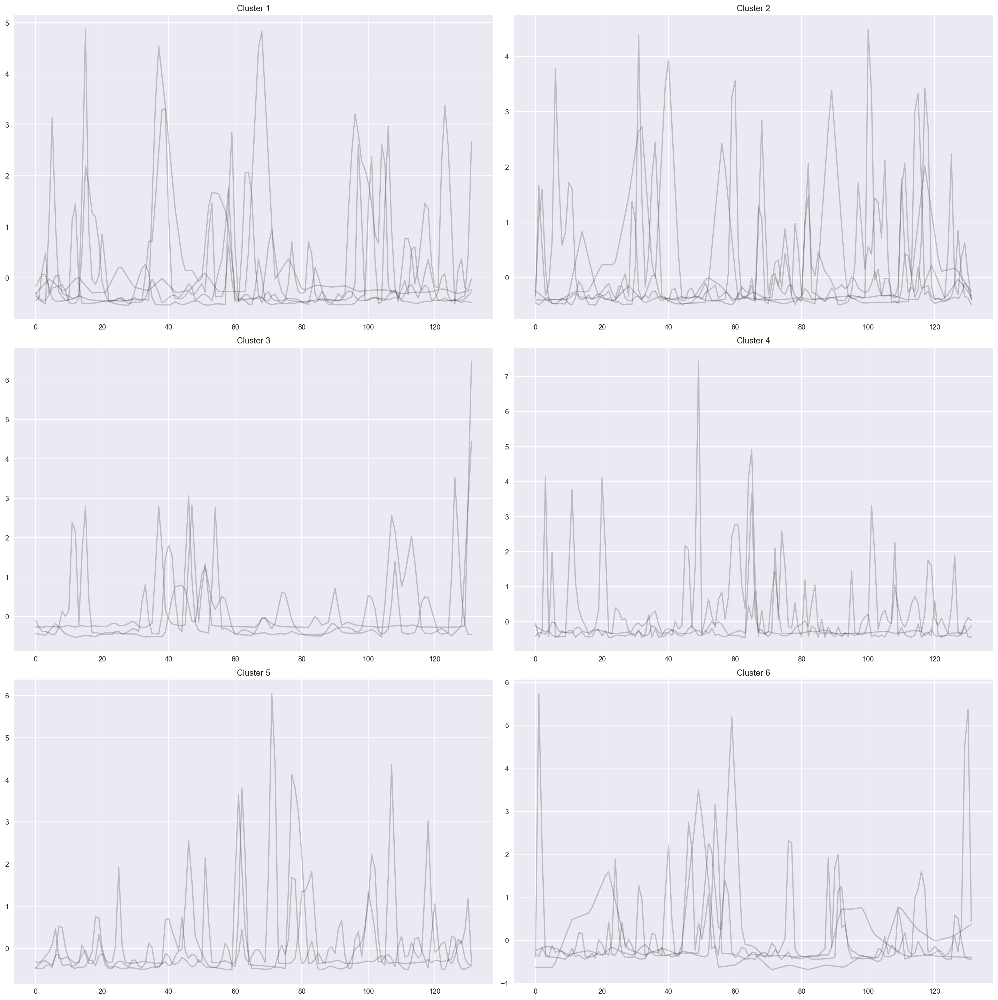

In [44]:
use_kernel_kmeans(train_2, 6, seed)

## Выводы

Как и для цены, разделение на площадки позволяет сделать графики "чище".

# Итоги

Кластеризация по нормализованной цене выглядит намного лучше, чем по нормализованному объему сделки. При этом разделение данных на платформы позволяет выделить схожие тренды и делает графики более "понятными".

Результат кластеризации зависит от выбранного алгоритма. Причем нельзя выделить какой-то определенный алгоритм. Везде получались красивые картинки с временными рядами со схожим трендом.